# **Pre-trained ResNet-50 model trained on the KDEF dataset with input image resolution of 28x28.**

In [1]:
!pip install tensorboardX

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 8.2 MB/s eta 0:00:00


In [37]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
from torch.utils.data import Dataset
import os
import copy
from tensorboardX import SummaryWriter
from PIL import Image
import torchvision.transforms as transforms
import random
plt.ion()   # interactive mode
%matplotlib inline

In [38]:
# Set fixed seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [39]:
from zipfile import ZipFile
import os

zip_path = '/content/KEDF_downsample_28x28.zip'

extract_to = '/content'

os.makedirs(extract_to, exist_ok=True)

with ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'✅ Files extracted to: {extract_to}')

✅ Files extracted to: /content


In [40]:
import os

classes = {
    "AF": 0, "AN": 1, "DI": 2, "HA": 3, "NE": 4, "SA": 5, "SU": 6
}

root='/content/KEDF_downsample_28x28'
invalid_files = []

for path, subdirs, files in os.walk(root):
    for name in files:
        if len(name) >= 6:
            emotion_code = name[4:6]
            if emotion_code not in classes:
                invalid_files.append(os.path.join(path, name))

# Print the problematic files
print("Found {} problematic files:".format(len(invalid_files)))
for file in invalid_files:
    print(file)

Found 0 problematic files:


In [41]:
class KDEFDataset(Dataset):
    def __init__(self, root='/content/KEDF_downsample_28x28', transforms_=None, idx=[]):
        self.transform = transforms_
        self.files = []

        for path, subdirs, files in os.walk(root):
            for name in files:
                self.files.append(os.path.join(path, name))

        self.files =  [self.files[i] for i in idx]
        self.classes = {
             "AF":0,
             "AN":1,
             "DI":2,
             "HA":3,
             "NE":4,
             "SA":5,
             "SU":6
        }
        for f in self.files:
          name = f.split('/')[-1]
          emotion_code = name[4:6]
          if emotion_code not in self.classes:
              print(f"Invalid file: {f} (code: {emotion_code})")

        for index in range(4900):
            filepath = self.files[index % len(self.files)]
            filename = filepath.split('/')[-1]
            if filename[4:6] not in self.classes:
                print(filepath)

    def __getitem__(self, index):
        filepath = self.files[index % len(self.files)]

        filename = filepath.split('/')[-1]
        img = self.transform(Image.open(filepath))
        label = self.classes[filename[4:6]]

        return img, label

    def __len__(self):
        return len(self.files)

Load Data
---------


In [42]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
    'val': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
}

idx = np.random.permutation(4900)
idx = {'val': idx[0:490], 'train': idx[490:]}

g = torch.Generator()
g.manual_seed(42)

dataloaders = {
    x: torch.utils.data.DataLoader(
        KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
        batch_size=32,
        shuffle=True,
        generator=g
    )
    for x in ['train', 'val']
}

dataset_sizes = {x: len(idx[x]) for x in ['train', 'val']}
class_names = 7

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Visualize a few images


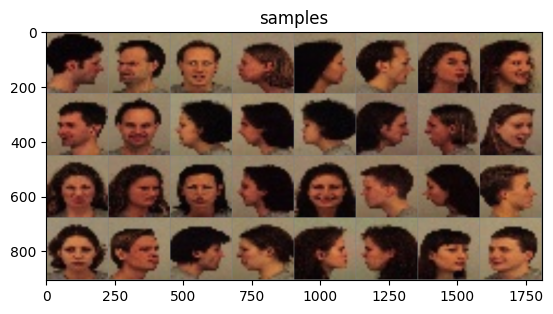

In [48]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title='samples')

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [49]:
from tqdm import tqdm

def train_model(model, criterion, optimizer, scheduler, dataloaders, writer=None, i=0,  num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))


            writer.add_scalar(phase+"/loss", epoch_loss, epoch)
            writer.add_scalar(phase+"/acc", epoch_acc, epoch)


            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                torch.save(model.state_dict(), 'saved/resnet_'+str(i)+'.pt')

        print()


    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, best_acc

Visualizing the model predictions

In [53]:
import imageio
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

def visualize_model_misclassified(model, dataloader, class_names, save_dir='misclassified', num_images=15, columns=3):
    os.makedirs(save_dir, exist_ok=True)
    was_training = model.training
    model.eval()
    images_so_far = 0
    rows = (num_images + columns - 1) // columns
    fig, axes = plt.subplots(rows, columns, figsize=(columns * 4, rows * 4))
    axes = axes.flatten()

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                if preds[j] != labels[j]:
                    if images_so_far >= num_images:
                        break

                    # --- Display in grid ---
                    ax = axes[images_so_far]
                    ax.axis('off')
                    ax.set_title(f'Pred: {class_names[int(preds[j])]},\nTrue: {class_names[int(labels[j])]}', fontsize=9)
                    imshow(inputs.cpu().data[j], ax=ax)

                    # --- Save image with overlay text ---
                    img = inputs[j].cpu().numpy().transpose(1, 2, 0)
                    img = (img * 0.5 + 0.5) * 255
                    img = img.astype(np.uint8)
                    img_pil = Image.fromarray(img)

                    draw = ImageDraw.Draw(img_pil)
                    font = ImageFont.load_default()
                    text = f'Predicted: {class_names[int(preds[j])]} | True: {class_names[int(labels[j])]}'
                    draw.rectangle([10, 10, 280, 25], fill=(255, 255, 255))
                    draw.text((10, 10), text, font=font, fill=(0, 0, 0))

                    img_pil.save(f'{save_dir}/misclassified_{images_so_far + 1}.jpg')

                    images_so_far += 1

    for k in range(images_so_far, len(axes)):
        axes[k].axis('off')

    plt.tight_layout()
    plt.show()
    model.train(mode=was_training)


def imshow(inp, ax=None, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    if ax is None:
        plt.imshow(inp)
    else:
        ax.imshow(inp)
    if title is not None:
        ax.set_title(title)


Finetuning the convnet
----------------------

Load a pretrained model and reset final fully connected layer.




Epoch 0/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.73it/s]


train Loss: 1.8482 Acc: 0.2399


100%|██████████| 16/16 [00:00<00:00, 18.86it/s]


val Loss: 1.5809 Acc: 0.4224

Epoch 1/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.71it/s]


train Loss: 1.1959 Acc: 0.5556


100%|██████████| 16/16 [00:00<00:00, 18.71it/s]


val Loss: 1.0076 Acc: 0.5918

Epoch 2/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.73it/s]


train Loss: 0.8490 Acc: 0.6887


100%|██████████| 16/16 [00:00<00:00, 18.89it/s]


val Loss: 0.9851 Acc: 0.6347

Epoch 3/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.65it/s]


train Loss: 0.6571 Acc: 0.7544


100%|██████████| 16/16 [00:00<00:00, 18.35it/s]


val Loss: 0.8928 Acc: 0.6612

Epoch 4/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.74it/s]


train Loss: 0.4969 Acc: 0.8177


100%|██████████| 16/16 [00:00<00:00, 18.23it/s]


val Loss: 0.8136 Acc: 0.7061

Epoch 5/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.66it/s]


train Loss: 0.3113 Acc: 0.9059


100%|██████████| 16/16 [00:00<00:00, 17.77it/s]


val Loss: 0.6474 Acc: 0.7571

Epoch 6/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.61it/s]


train Loss: 0.2586 Acc: 0.9277


100%|██████████| 16/16 [00:00<00:00, 18.73it/s]


val Loss: 0.6478 Acc: 0.7571

Epoch 7/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.61it/s]


train Loss: 0.2228 Acc: 0.9361


100%|██████████| 16/16 [00:00<00:00, 18.92it/s]


val Loss: 0.6450 Acc: 0.7612

Epoch 8/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.71it/s]


train Loss: 0.2033 Acc: 0.9481


100%|██████████| 16/16 [00:00<00:00, 18.69it/s]


val Loss: 0.6496 Acc: 0.7510

Epoch 9/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.68it/s]


train Loss: 0.1819 Acc: 0.9533


100%|██████████| 16/16 [00:00<00:00, 17.65it/s]


val Loss: 0.6573 Acc: 0.7633

Epoch 10/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.72it/s]


train Loss: 0.1643 Acc: 0.9565


100%|██████████| 16/16 [00:00<00:00, 18.54it/s]


val Loss: 0.6712 Acc: 0.7510

Epoch 11/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.67it/s]


train Loss: 0.1433 Acc: 0.9671


100%|██████████| 16/16 [00:00<00:00, 18.75it/s]


val Loss: 0.6662 Acc: 0.7510

Epoch 12/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.72it/s]


train Loss: 0.1416 Acc: 0.9658


100%|██████████| 16/16 [00:00<00:00, 18.29it/s]


val Loss: 0.6748 Acc: 0.7612

Epoch 13/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.74it/s]


train Loss: 0.1416 Acc: 0.9653


100%|██████████| 16/16 [00:00<00:00, 18.16it/s]


val Loss: 0.6753 Acc: 0.7571

Epoch 14/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.62it/s]


train Loss: 0.1355 Acc: 0.9712


100%|██████████| 16/16 [00:00<00:00, 17.60it/s]


val Loss: 0.6741 Acc: 0.7592

Epoch 15/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.74it/s]


train Loss: 0.1372 Acc: 0.9692


100%|██████████| 16/16 [00:00<00:00, 18.01it/s]


val Loss: 0.6712 Acc: 0.7694

Epoch 16/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.71it/s]


train Loss: 0.1307 Acc: 0.9696


100%|██████████| 16/16 [00:00<00:00, 18.51it/s]


val Loss: 0.6728 Acc: 0.7673

Epoch 17/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.70it/s]


train Loss: 0.1354 Acc: 0.9689


100%|██████████| 16/16 [00:00<00:00, 18.99it/s]


val Loss: 0.6678 Acc: 0.7755

Epoch 18/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.74it/s]


train Loss: 0.1294 Acc: 0.9726


100%|██████████| 16/16 [00:00<00:00, 18.74it/s]


val Loss: 0.6697 Acc: 0.7571

Epoch 19/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.67it/s]


train Loss: 0.1334 Acc: 0.9730


100%|██████████| 16/16 [00:00<00:00, 18.21it/s]


val Loss: 0.6681 Acc: 0.7592

Training complete in 4m 16s
Best val Acc: 0.775510
Showing misclassified examples for fold 0...


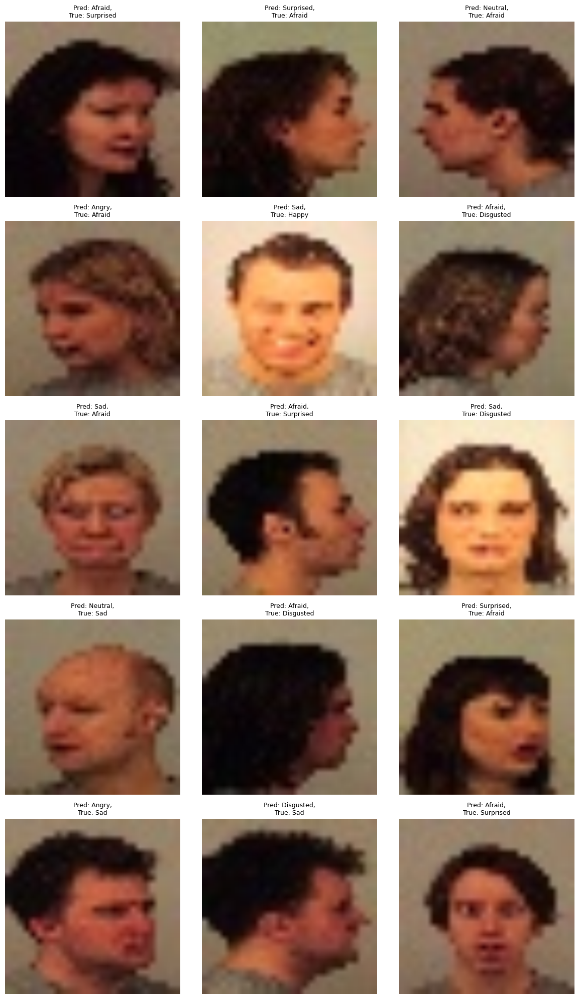




------------------------------------
 Accuracies  [0.7755102040816327]



Epoch 0/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.55it/s]


train Loss: 1.8279 Acc: 0.2594


100%|██████████| 16/16 [00:00<00:00, 17.88it/s]


val Loss: 1.5035 Acc: 0.4490

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.50it/s]


train Loss: 1.1945 Acc: 0.5404


100%|██████████| 16/16 [00:00<00:00, 17.75it/s]


val Loss: 1.1170 Acc: 0.5592

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.48it/s]


train Loss: 0.8384 Acc: 0.6862


100%|██████████| 16/16 [00:00<00:00, 17.84it/s]


val Loss: 0.9106 Acc: 0.6592

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.44it/s]


train Loss: 0.6441 Acc: 0.7662


100%|██████████| 16/16 [00:00<00:00, 18.69it/s]


val Loss: 0.8241 Acc: 0.6918

Epoch 4/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.61it/s]


train Loss: 0.4787 Acc: 0.8329


100%|██████████| 16/16 [00:00<00:00, 18.07it/s]


val Loss: 0.9658 Acc: 0.6633

Epoch 5/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.59it/s]


train Loss: 0.3117 Acc: 0.8957


100%|██████████| 16/16 [00:00<00:00, 17.39it/s]


val Loss: 0.7340 Acc: 0.7143

Epoch 6/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.55it/s]


train Loss: 0.2474 Acc: 0.9279


100%|██████████| 16/16 [00:00<00:00, 17.92it/s]


val Loss: 0.7072 Acc: 0.7306

Epoch 7/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.59it/s]


train Loss: 0.2166 Acc: 0.9463


100%|██████████| 16/16 [00:00<00:00, 18.24it/s]


val Loss: 0.7055 Acc: 0.7367

Epoch 8/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.64it/s]


train Loss: 0.1950 Acc: 0.9458


100%|██████████| 16/16 [00:00<00:00, 18.12it/s]


val Loss: 0.7160 Acc: 0.7429

Epoch 9/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.55it/s]


train Loss: 0.1735 Acc: 0.9546


100%|██████████| 16/16 [00:00<00:00, 17.47it/s]


val Loss: 0.7228 Acc: 0.7327

Epoch 10/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.52it/s]


train Loss: 0.1569 Acc: 0.9619


100%|██████████| 16/16 [00:00<00:00, 17.13it/s]


val Loss: 0.7243 Acc: 0.7531

Epoch 11/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.65it/s]


train Loss: 0.1338 Acc: 0.9712


100%|██████████| 16/16 [00:00<00:00, 18.67it/s]


val Loss: 0.7158 Acc: 0.7531

Epoch 12/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.55it/s]


train Loss: 0.1320 Acc: 0.9723


100%|██████████| 16/16 [00:00<00:00, 18.08it/s]


val Loss: 0.7237 Acc: 0.7531

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.47it/s]


train Loss: 0.1381 Acc: 0.9701


100%|██████████| 16/16 [00:00<00:00, 18.13it/s]


val Loss: 0.7250 Acc: 0.7510

Epoch 14/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.57it/s]


train Loss: 0.1345 Acc: 0.9696


100%|██████████| 16/16 [00:00<00:00, 18.48it/s]


val Loss: 0.7213 Acc: 0.7490

Epoch 15/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.64it/s]


train Loss: 0.1277 Acc: 0.9739


100%|██████████| 16/16 [00:00<00:00, 18.57it/s]


val Loss: 0.7261 Acc: 0.7388

Epoch 16/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.57it/s]


train Loss: 0.1268 Acc: 0.9719


100%|██████████| 16/16 [00:00<00:00, 18.12it/s]


val Loss: 0.7257 Acc: 0.7429

Epoch 17/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.56it/s]


train Loss: 0.1231 Acc: 0.9766


100%|██████████| 16/16 [00:00<00:00, 17.78it/s]


val Loss: 0.7097 Acc: 0.7408

Epoch 18/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.55it/s]


train Loss: 0.1255 Acc: 0.9748


100%|██████████| 16/16 [00:00<00:00, 18.20it/s]


val Loss: 0.7203 Acc: 0.7388

Epoch 19/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.65it/s]


train Loss: 0.1220 Acc: 0.9748


100%|██████████| 16/16 [00:00<00:00, 17.80it/s]


val Loss: 0.7102 Acc: 0.7449

Training complete in 4m 19s
Best val Acc: 0.753061
Showing misclassified examples for fold 1...


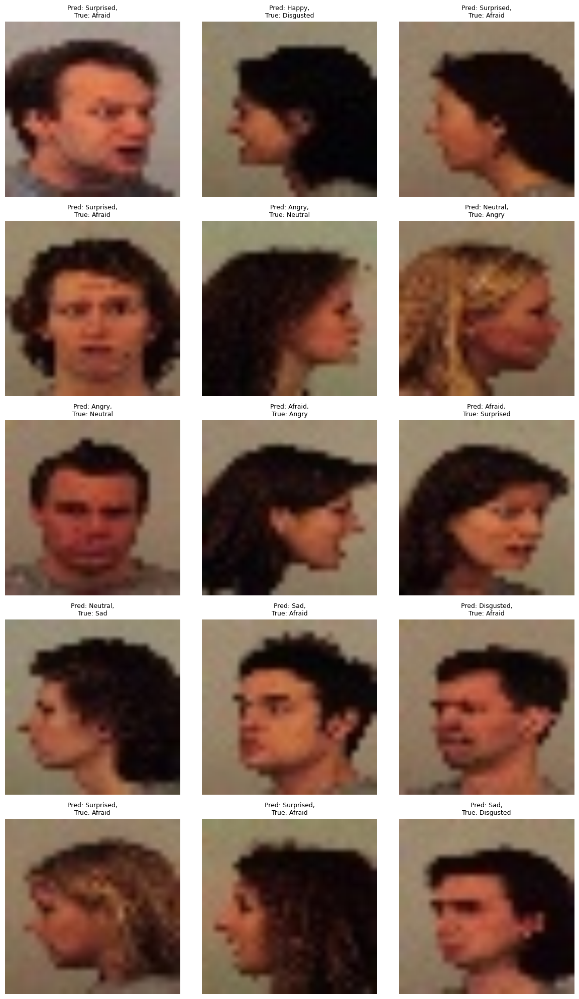




------------------------------------
 Accuracies  [0.7755102040816327, 0.753061224489796]



Epoch 0/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.60it/s]


train Loss: 1.8563 Acc: 0.2356


100%|██████████| 16/16 [00:00<00:00, 18.20it/s]


val Loss: 1.6614 Acc: 0.3327

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.47it/s]


train Loss: 1.2419 Acc: 0.5311


100%|██████████| 16/16 [00:00<00:00, 18.77it/s]


val Loss: 1.1167 Acc: 0.5592

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 0.8503 Acc: 0.6891


100%|██████████| 16/16 [00:00<00:00, 18.34it/s]


val Loss: 0.9696 Acc: 0.6490

Epoch 3/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.60it/s]


train Loss: 0.6716 Acc: 0.7549


100%|██████████| 16/16 [00:00<00:00, 18.08it/s]


val Loss: 0.9972 Acc: 0.6286

Epoch 4/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.56it/s]


train Loss: 0.4979 Acc: 0.8254


100%|██████████| 16/16 [00:00<00:00, 17.90it/s]


val Loss: 1.0974 Acc: 0.6286

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.42it/s]


train Loss: 0.3229 Acc: 0.8959


100%|██████████| 16/16 [00:00<00:00, 17.07it/s]


val Loss: 0.6829 Acc: 0.7469

Epoch 6/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.50it/s]


train Loss: 0.2599 Acc: 0.9215


100%|██████████| 16/16 [00:00<00:00, 17.84it/s]


val Loss: 0.6466 Acc: 0.7449

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 0.2278 Acc: 0.9361


100%|██████████| 16/16 [00:00<00:00, 18.52it/s]


val Loss: 0.6492 Acc: 0.7551

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 0.1963 Acc: 0.9485


100%|██████████| 16/16 [00:00<00:00, 18.19it/s]


val Loss: 0.6431 Acc: 0.7551

Epoch 9/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.57it/s]


train Loss: 0.1772 Acc: 0.9567


100%|██████████| 16/16 [00:00<00:00, 18.27it/s]


val Loss: 0.6475 Acc: 0.7694

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.39it/s]


train Loss: 0.1622 Acc: 0.9585


100%|██████████| 16/16 [00:00<00:00, 18.33it/s]


val Loss: 0.6532 Acc: 0.7571

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.42it/s]


train Loss: 0.1465 Acc: 0.9651


100%|██████████| 16/16 [00:00<00:00, 17.47it/s]


val Loss: 0.6513 Acc: 0.7633

Epoch 12/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.58it/s]


train Loss: 0.1448 Acc: 0.9653


100%|██████████| 16/16 [00:00<00:00, 18.31it/s]


val Loss: 0.6561 Acc: 0.7531

Epoch 13/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.56it/s]


train Loss: 0.1407 Acc: 0.9698


100%|██████████| 16/16 [00:00<00:00, 17.67it/s]


val Loss: 0.6468 Acc: 0.7653

Epoch 14/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.53it/s]


train Loss: 0.1387 Acc: 0.9687


100%|██████████| 16/16 [00:00<00:00, 17.65it/s]


val Loss: 0.6423 Acc: 0.7592

Epoch 15/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.67it/s]


train Loss: 0.1356 Acc: 0.9710


100%|██████████| 16/16 [00:00<00:00, 18.47it/s]


val Loss: 0.6489 Acc: 0.7571

Epoch 16/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.60it/s]


train Loss: 0.1393 Acc: 0.9680


100%|██████████| 16/16 [00:00<00:00, 18.51it/s]


val Loss: 0.6499 Acc: 0.7592

Epoch 17/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.57it/s]


train Loss: 0.1421 Acc: 0.9671


100%|██████████| 16/16 [00:00<00:00, 18.63it/s]


val Loss: 0.6432 Acc: 0.7612

Epoch 18/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.54it/s]


train Loss: 0.1369 Acc: 0.9689


100%|██████████| 16/16 [00:00<00:00, 18.15it/s]


val Loss: 0.6464 Acc: 0.7551

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 0.1352 Acc: 0.9685


100%|██████████| 16/16 [00:00<00:00, 18.80it/s]


val Loss: 0.6463 Acc: 0.7612

Training complete in 4m 19s
Best val Acc: 0.769388
Showing misclassified examples for fold 2...


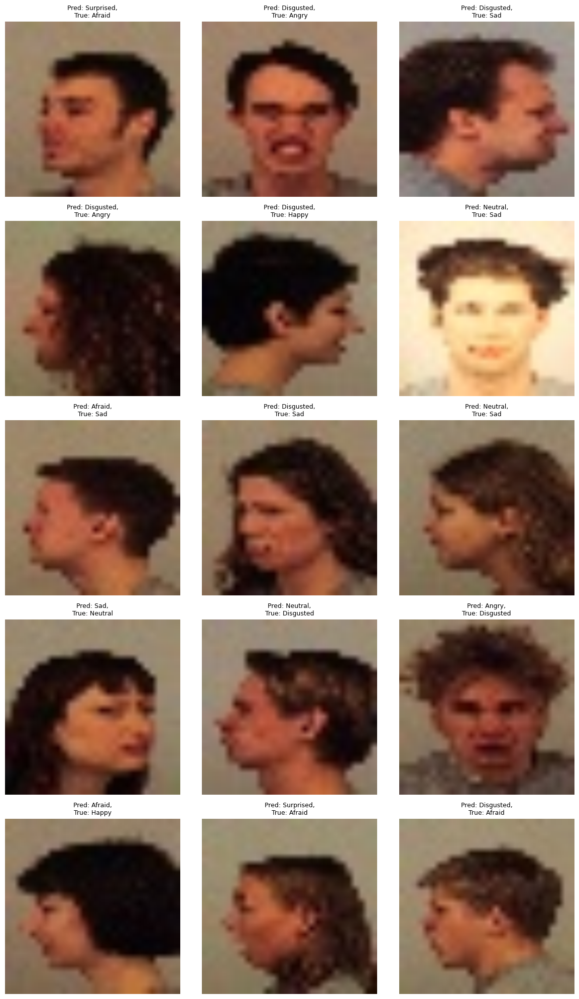




------------------------------------
 Accuracies  [0.7755102040816327, 0.753061224489796, 0.7693877551020409]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 1.8885 Acc: 0.2172


100%|██████████| 16/16 [00:00<00:00, 17.44it/s]


val Loss: 1.7133 Acc: 0.3306

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.45it/s]


train Loss: 1.3324 Acc: 0.4959


100%|██████████| 16/16 [00:00<00:00, 17.63it/s]


val Loss: 1.2498 Acc: 0.5102

Epoch 2/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.51it/s]


train Loss: 0.8911 Acc: 0.6612


100%|██████████| 16/16 [00:00<00:00, 18.10it/s]


val Loss: 0.9330 Acc: 0.6347

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.43it/s]


train Loss: 0.6744 Acc: 0.7531


100%|██████████| 16/16 [00:00<00:00, 17.43it/s]


val Loss: 1.0292 Acc: 0.6102

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.41it/s]


train Loss: 0.5038 Acc: 0.8127


100%|██████████| 16/16 [00:00<00:00, 17.90it/s]


val Loss: 0.7936 Acc: 0.6857

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.34it/s]


train Loss: 0.3246 Acc: 0.8925


100%|██████████| 16/16 [00:00<00:00, 17.96it/s]


val Loss: 0.6446 Acc: 0.7408

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.48it/s]


train Loss: 0.2623 Acc: 0.9224


100%|██████████| 16/16 [00:00<00:00, 18.08it/s]


val Loss: 0.6219 Acc: 0.7735

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.47it/s]


train Loss: 0.2341 Acc: 0.9324


100%|██████████| 16/16 [00:00<00:00, 18.15it/s]


val Loss: 0.6417 Acc: 0.7531

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 0.2041 Acc: 0.9444


100%|██████████| 16/16 [00:00<00:00, 16.75it/s]


val Loss: 0.6218 Acc: 0.7592

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.38it/s]


train Loss: 0.1874 Acc: 0.9497


100%|██████████| 16/16 [00:00<00:00, 17.62it/s]


val Loss: 0.6356 Acc: 0.7653

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.40it/s]


train Loss: 0.1716 Acc: 0.9558


100%|██████████| 16/16 [00:00<00:00, 18.33it/s]


val Loss: 0.6575 Acc: 0.7531

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.47it/s]


train Loss: 0.1525 Acc: 0.9655


100%|██████████| 16/16 [00:00<00:00, 18.11it/s]


val Loss: 0.6267 Acc: 0.7776

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.48it/s]


train Loss: 0.1468 Acc: 0.9669


100%|██████████| 16/16 [00:00<00:00, 18.72it/s]


val Loss: 0.6495 Acc: 0.7469

Epoch 13/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.57it/s]


train Loss: 0.1414 Acc: 0.9687


100%|██████████| 16/16 [00:00<00:00, 17.59it/s]


val Loss: 0.6331 Acc: 0.7612

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.44it/s]


train Loss: 0.1394 Acc: 0.9707


100%|██████████| 16/16 [00:00<00:00, 17.43it/s]


val Loss: 0.6494 Acc: 0.7469

Epoch 15/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.59it/s]


train Loss: 0.1369 Acc: 0.9712


100%|██████████| 16/16 [00:00<00:00, 17.88it/s]


val Loss: 0.6490 Acc: 0.7510

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.48it/s]


train Loss: 0.1371 Acc: 0.9732


100%|██████████| 16/16 [00:00<00:00, 18.43it/s]


val Loss: 0.6247 Acc: 0.7673

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.41it/s]


train Loss: 0.1412 Acc: 0.9678


100%|██████████| 16/16 [00:00<00:00, 17.19it/s]


val Loss: 0.6426 Acc: 0.7571

Epoch 18/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.54it/s]


train Loss: 0.1353 Acc: 0.9717


100%|██████████| 16/16 [00:00<00:00, 17.98it/s]


val Loss: 0.6294 Acc: 0.7755

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.42it/s]


train Loss: 0.1321 Acc: 0.9735


100%|██████████| 16/16 [00:00<00:00, 18.23it/s]


val Loss: 0.6431 Acc: 0.7612

Training complete in 4m 21s
Best val Acc: 0.777551
Showing misclassified examples for fold 3...


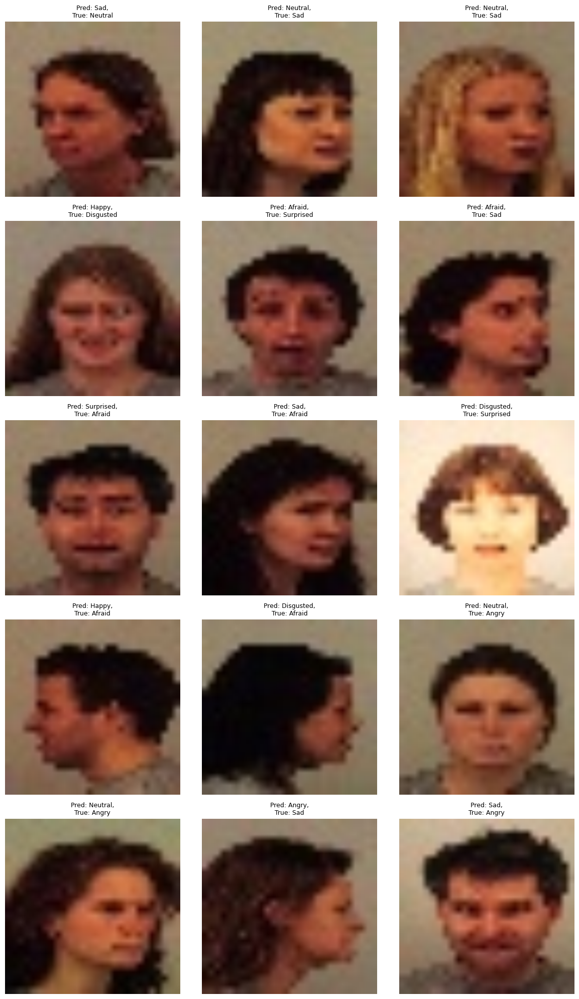




------------------------------------
 Accuracies  [0.7755102040816327, 0.753061224489796, 0.7693877551020409, 0.7775510204081634]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.40it/s]


train Loss: 1.8592 Acc: 0.2299


100%|██████████| 16/16 [00:00<00:00, 16.71it/s]


val Loss: 1.5353 Acc: 0.4082

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.38it/s]


train Loss: 1.2143 Acc: 0.5467


100%|██████████| 16/16 [00:00<00:00, 18.55it/s]


val Loss: 1.0195 Acc: 0.6204

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.37it/s]


train Loss: 0.8361 Acc: 0.6893


100%|██████████| 16/16 [00:00<00:00, 18.32it/s]


val Loss: 1.0869 Acc: 0.6020

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.41it/s]


train Loss: 0.6344 Acc: 0.7683


100%|██████████| 16/16 [00:00<00:00, 17.02it/s]


val Loss: 0.8100 Acc: 0.6837

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.42it/s]


train Loss: 0.4758 Acc: 0.8329


100%|██████████| 16/16 [00:00<00:00, 18.54it/s]


val Loss: 0.9070 Acc: 0.6571

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.45it/s]


train Loss: 0.3015 Acc: 0.9084


100%|██████████| 16/16 [00:00<00:00, 18.17it/s]


val Loss: 0.6679 Acc: 0.7490

Epoch 6/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.53it/s]


train Loss: 0.2397 Acc: 0.9367


100%|██████████| 16/16 [00:00<00:00, 17.08it/s]


val Loss: 0.6582 Acc: 0.7551

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.50it/s]


train Loss: 0.2022 Acc: 0.9488


100%|██████████| 16/16 [00:00<00:00, 18.40it/s]


val Loss: 0.6644 Acc: 0.7612

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.50it/s]


train Loss: 0.1952 Acc: 0.9476


100%|██████████| 16/16 [00:00<00:00, 17.97it/s]


val Loss: 0.6603 Acc: 0.7653

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.49it/s]


train Loss: 0.1670 Acc: 0.9610


100%|██████████| 16/16 [00:00<00:00, 17.18it/s]


val Loss: 0.6705 Acc: 0.7551

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.47it/s]


train Loss: 0.1485 Acc: 0.9630


100%|██████████| 16/16 [00:00<00:00, 18.47it/s]


val Loss: 0.6856 Acc: 0.7531

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.49it/s]


train Loss: 0.1435 Acc: 0.9676


100%|██████████| 16/16 [00:00<00:00, 18.37it/s]


val Loss: 0.6873 Acc: 0.7551

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.48it/s]


train Loss: 0.1325 Acc: 0.9712


100%|██████████| 16/16 [00:00<00:00, 17.91it/s]


val Loss: 0.6825 Acc: 0.7571

Epoch 13/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.52it/s]


train Loss: 0.1272 Acc: 0.9730


100%|██████████| 16/16 [00:00<00:00, 17.44it/s]


val Loss: 0.6756 Acc: 0.7633

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 0.1319 Acc: 0.9735


100%|██████████| 16/16 [00:00<00:00, 17.86it/s]


val Loss: 0.6610 Acc: 0.7531

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.44it/s]


train Loss: 0.1257 Acc: 0.9739


100%|██████████| 16/16 [00:00<00:00, 18.28it/s]


val Loss: 0.6738 Acc: 0.7612

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.41it/s]


train Loss: 0.1293 Acc: 0.9728


100%|██████████| 16/16 [00:00<00:00, 16.85it/s]


val Loss: 0.6639 Acc: 0.7592

Epoch 17/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.58it/s]


train Loss: 0.1298 Acc: 0.9689


100%|██████████| 16/16 [00:00<00:00, 18.65it/s]


val Loss: 0.6663 Acc: 0.7490

Epoch 18/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.63it/s]


train Loss: 0.1344 Acc: 0.9701


100%|██████████| 16/16 [00:00<00:00, 17.69it/s]


val Loss: 0.6600 Acc: 0.7531

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.44it/s]


train Loss: 0.1250 Acc: 0.9746


100%|██████████| 16/16 [00:00<00:00, 17.92it/s]


val Loss: 0.6636 Acc: 0.7673

Training complete in 4m 21s
Best val Acc: 0.767347
Showing misclassified examples for fold 4...


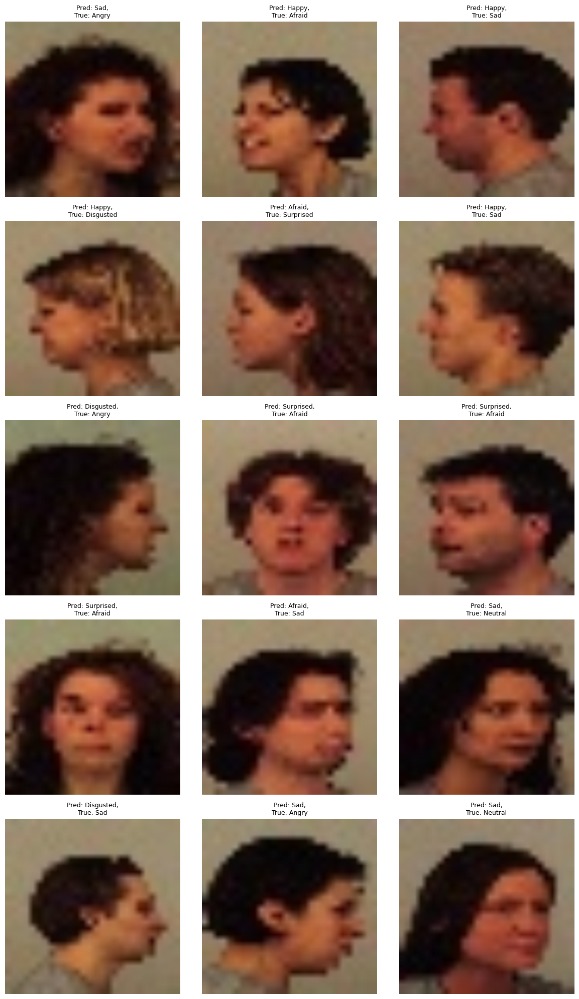




------------------------------------
 Accuracies  [0.7755102040816327, 0.753061224489796, 0.7693877551020409, 0.7775510204081634, 0.7673469387755103]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.41it/s]


train Loss: 1.8214 Acc: 0.2569


100%|██████████| 16/16 [00:00<00:00, 18.39it/s]


val Loss: 1.6035 Acc: 0.3510

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.49it/s]


train Loss: 1.1991 Acc: 0.5519


100%|██████████| 16/16 [00:00<00:00, 16.87it/s]


val Loss: 1.1448 Acc: 0.5592

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.45it/s]


train Loss: 0.8828 Acc: 0.6637


100%|██████████| 16/16 [00:00<00:00, 16.73it/s]


val Loss: 0.9626 Acc: 0.6571

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.41it/s]


train Loss: 0.6570 Acc: 0.7574


100%|██████████| 16/16 [00:00<00:00, 18.46it/s]


val Loss: 0.9016 Acc: 0.6633

Epoch 4/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.53it/s]


train Loss: 0.5060 Acc: 0.8206


100%|██████████| 16/16 [00:00<00:00, 18.80it/s]


val Loss: 1.1128 Acc: 0.6224

Epoch 5/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.56it/s]


train Loss: 0.3095 Acc: 0.9007


100%|██████████| 16/16 [00:00<00:00, 18.21it/s]


val Loss: 0.6886 Acc: 0.7714

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.32it/s]


train Loss: 0.2535 Acc: 0.9281


100%|██████████| 16/16 [00:00<00:00, 17.57it/s]


val Loss: 0.6836 Acc: 0.7796

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.49it/s]


train Loss: 0.2224 Acc: 0.9354


100%|██████████| 16/16 [00:00<00:00, 18.28it/s]


val Loss: 0.6925 Acc: 0.7694

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 0.2024 Acc: 0.9454


100%|██████████| 16/16 [00:00<00:00, 18.36it/s]


val Loss: 0.6608 Acc: 0.7735

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.50it/s]


train Loss: 0.1719 Acc: 0.9578


100%|██████████| 16/16 [00:00<00:00, 17.28it/s]


val Loss: 0.6570 Acc: 0.7959

Epoch 10/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.51it/s]


train Loss: 0.1583 Acc: 0.9621


100%|██████████| 16/16 [00:00<00:00, 18.38it/s]


val Loss: 0.6643 Acc: 0.7980

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.38it/s]


train Loss: 0.1435 Acc: 0.9664


100%|██████████| 16/16 [00:00<00:00, 18.07it/s]


val Loss: 0.6542 Acc: 0.7918

Epoch 12/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.50it/s]


train Loss: 0.1399 Acc: 0.9698


100%|██████████| 16/16 [00:00<00:00, 17.42it/s]


val Loss: 0.6717 Acc: 0.7776

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.42it/s]


train Loss: 0.1393 Acc: 0.9696


100%|██████████| 16/16 [00:00<00:00, 18.56it/s]


val Loss: 0.6711 Acc: 0.7857

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 0.1322 Acc: 0.9717


100%|██████████| 16/16 [00:00<00:00, 17.45it/s]


val Loss: 0.6621 Acc: 0.7918

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.45it/s]


train Loss: 0.1403 Acc: 0.9669


100%|██████████| 16/16 [00:00<00:00, 17.64it/s]


val Loss: 0.6619 Acc: 0.7959

Epoch 16/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.50it/s]


train Loss: 0.1326 Acc: 0.9728


100%|██████████| 16/16 [00:00<00:00, 18.84it/s]


val Loss: 0.6430 Acc: 0.7898

Epoch 17/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.56it/s]


train Loss: 0.1304 Acc: 0.9732


100%|██████████| 16/16 [00:00<00:00, 18.75it/s]


val Loss: 0.6494 Acc: 0.8000

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.38it/s]


train Loss: 0.1277 Acc: 0.9737


100%|██████████| 16/16 [00:00<00:00, 18.49it/s]


val Loss: 0.6611 Acc: 0.7980

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 0.1271 Acc: 0.9746


100%|██████████| 16/16 [00:00<00:00, 18.04it/s]


val Loss: 0.6718 Acc: 0.7837

Training complete in 4m 21s
Best val Acc: 0.800000
Showing misclassified examples for fold 5...


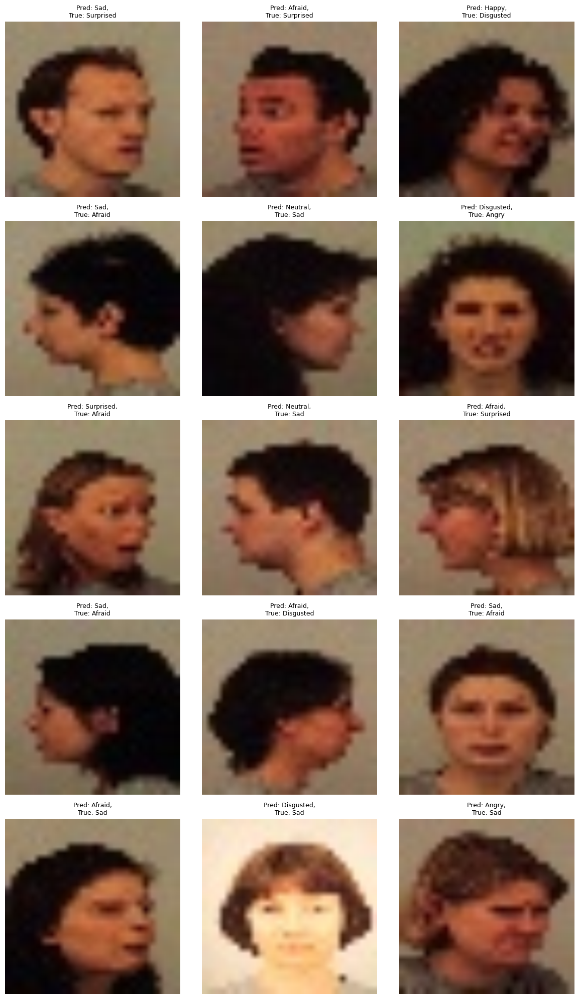




------------------------------------
 Accuracies  [0.7755102040816327, 0.753061224489796, 0.7693877551020409, 0.7775510204081634, 0.7673469387755103, 0.8]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.36it/s]


train Loss: 1.8259 Acc: 0.2519


100%|██████████| 16/16 [00:00<00:00, 18.10it/s]


val Loss: 1.4463 Acc: 0.4653

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.34it/s]


train Loss: 1.1947 Acc: 0.5546


100%|██████████| 16/16 [00:00<00:00, 17.11it/s]


val Loss: 1.1601 Acc: 0.5592

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.44it/s]


train Loss: 0.8539 Acc: 0.6844


100%|██████████| 16/16 [00:00<00:00, 17.93it/s]


val Loss: 0.8902 Acc: 0.6837

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.36it/s]


train Loss: 0.6462 Acc: 0.7633


100%|██████████| 16/16 [00:00<00:00, 18.34it/s]


val Loss: 0.8567 Acc: 0.6939

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.45it/s]


train Loss: 0.4901 Acc: 0.8279


100%|██████████| 16/16 [00:00<00:00, 17.94it/s]


val Loss: 1.1237 Acc: 0.5939

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.42it/s]


train Loss: 0.3214 Acc: 0.8961


100%|██████████| 16/16 [00:00<00:00, 18.47it/s]


val Loss: 0.6473 Acc: 0.7592

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.30it/s]


train Loss: 0.2539 Acc: 0.9243


100%|██████████| 16/16 [00:00<00:00, 18.04it/s]


val Loss: 0.6395 Acc: 0.7735

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.43it/s]


train Loss: 0.2176 Acc: 0.9374


100%|██████████| 16/16 [00:00<00:00, 17.95it/s]


val Loss: 0.6176 Acc: 0.7735

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 0.2039 Acc: 0.9451


100%|██████████| 16/16 [00:00<00:00, 16.12it/s]


val Loss: 0.6313 Acc: 0.7755

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.45it/s]


train Loss: 0.1792 Acc: 0.9571


100%|██████████| 16/16 [00:00<00:00, 17.64it/s]


val Loss: 0.6332 Acc: 0.7694

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.47it/s]


train Loss: 0.1597 Acc: 0.9601


100%|██████████| 16/16 [00:00<00:00, 18.26it/s]


val Loss: 0.6484 Acc: 0.7816

Epoch 11/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.53it/s]


train Loss: 0.1415 Acc: 0.9698


100%|██████████| 16/16 [00:00<00:00, 17.83it/s]


val Loss: 0.6464 Acc: 0.7816

Epoch 12/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.50it/s]


train Loss: 0.1351 Acc: 0.9741


100%|██████████| 16/16 [00:00<00:00, 17.71it/s]


val Loss: 0.6398 Acc: 0.7776

Epoch 13/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.52it/s]


train Loss: 0.1376 Acc: 0.9723


100%|██████████| 16/16 [00:00<00:00, 17.71it/s]


val Loss: 0.6398 Acc: 0.7776

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 0.1358 Acc: 0.9698


100%|██████████| 16/16 [00:00<00:00, 17.90it/s]


val Loss: 0.6463 Acc: 0.7714

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.43it/s]


train Loss: 0.1329 Acc: 0.9723


100%|██████████| 16/16 [00:00<00:00, 18.40it/s]


val Loss: 0.6530 Acc: 0.7755

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.40it/s]


train Loss: 0.1368 Acc: 0.9703


100%|██████████| 16/16 [00:00<00:00, 17.76it/s]


val Loss: 0.6328 Acc: 0.7776

Epoch 17/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.52it/s]


train Loss: 0.1339 Acc: 0.9703


100%|██████████| 16/16 [00:00<00:00, 17.70it/s]


val Loss: 0.6442 Acc: 0.7755

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.38it/s]


train Loss: 0.1314 Acc: 0.9707


100%|██████████| 16/16 [00:00<00:00, 18.01it/s]


val Loss: 0.6319 Acc: 0.7653

Epoch 19/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.52it/s]


train Loss: 0.1266 Acc: 0.9760


100%|██████████| 16/16 [00:00<00:00, 18.07it/s]


val Loss: 0.6447 Acc: 0.7694

Training complete in 4m 21s
Best val Acc: 0.781633
Showing misclassified examples for fold 6...


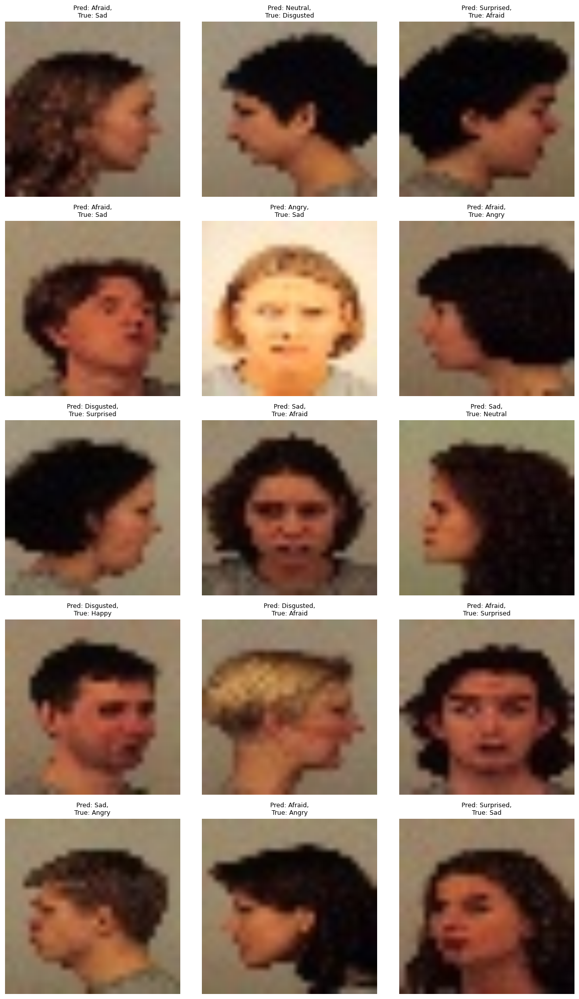




------------------------------------
 Accuracies  [0.7755102040816327, 0.753061224489796, 0.7693877551020409, 0.7775510204081634, 0.7673469387755103, 0.8, 0.7816326530612245]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.36it/s]


train Loss: 1.8464 Acc: 0.2488


100%|██████████| 16/16 [00:00<00:00, 17.94it/s]


val Loss: 1.4989 Acc: 0.4388

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.42it/s]


train Loss: 1.1900 Acc: 0.5551


100%|██████████| 16/16 [00:00<00:00, 18.74it/s]


val Loss: 1.0871 Acc: 0.5469

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.29it/s]


train Loss: 0.8511 Acc: 0.6846


100%|██████████| 16/16 [00:00<00:00, 17.83it/s]


val Loss: 1.3020 Acc: 0.5408

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.45it/s]


train Loss: 0.6240 Acc: 0.7710


100%|██████████| 16/16 [00:00<00:00, 17.83it/s]


val Loss: 0.9223 Acc: 0.6592

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.37it/s]


train Loss: 0.4675 Acc: 0.8349


100%|██████████| 16/16 [00:00<00:00, 18.28it/s]


val Loss: 0.8073 Acc: 0.7102

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.26it/s]


train Loss: 0.3055 Acc: 0.9029


100%|██████████| 16/16 [00:00<00:00, 18.12it/s]


val Loss: 0.7168 Acc: 0.7327

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.36it/s]


train Loss: 0.2431 Acc: 0.9315


100%|██████████| 16/16 [00:00<00:00, 17.86it/s]


val Loss: 0.7301 Acc: 0.7388

Epoch 7/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.51it/s]


train Loss: 0.2250 Acc: 0.9385


100%|██████████| 16/16 [00:00<00:00, 18.48it/s]


val Loss: 0.7222 Acc: 0.7469

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.48it/s]


train Loss: 0.1896 Acc: 0.9533


100%|██████████| 16/16 [00:00<00:00, 17.27it/s]


val Loss: 0.7221 Acc: 0.7347

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.43it/s]


train Loss: 0.1818 Acc: 0.9515


100%|██████████| 16/16 [00:00<00:00, 18.63it/s]


val Loss: 0.7269 Acc: 0.7551

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.19it/s]


train Loss: 0.1601 Acc: 0.9619


100%|██████████| 16/16 [00:00<00:00, 17.54it/s]


val Loss: 0.7291 Acc: 0.7388

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.41it/s]


train Loss: 0.1452 Acc: 0.9667


100%|██████████| 16/16 [00:00<00:00, 17.14it/s]


val Loss: 0.7418 Acc: 0.7429

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.46it/s]


train Loss: 0.1328 Acc: 0.9732


100%|██████████| 16/16 [00:00<00:00, 18.51it/s]


val Loss: 0.7314 Acc: 0.7449

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.22it/s]


train Loss: 0.1414 Acc: 0.9687


100%|██████████| 16/16 [00:00<00:00, 18.25it/s]


val Loss: 0.7187 Acc: 0.7449

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.37it/s]


train Loss: 0.1257 Acc: 0.9732


100%|██████████| 16/16 [00:00<00:00, 17.25it/s]


val Loss: 0.7488 Acc: 0.7429

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.37it/s]


train Loss: 0.1301 Acc: 0.9741


100%|██████████| 16/16 [00:00<00:00, 18.04it/s]


val Loss: 0.7309 Acc: 0.7510

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.33it/s]


train Loss: 0.1326 Acc: 0.9732


100%|██████████| 16/16 [00:00<00:00, 17.88it/s]


val Loss: 0.7160 Acc: 0.7592

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.32it/s]


train Loss: 0.1287 Acc: 0.9723


100%|██████████| 16/16 [00:00<00:00, 17.79it/s]


val Loss: 0.7129 Acc: 0.7551

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.35it/s]


train Loss: 0.1302 Acc: 0.9714


100%|██████████| 16/16 [00:00<00:00, 17.92it/s]


val Loss: 0.7076 Acc: 0.7449

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.48it/s]


train Loss: 0.1329 Acc: 0.9723


100%|██████████| 16/16 [00:00<00:00, 17.92it/s]


val Loss: 0.7213 Acc: 0.7510

Training complete in 4m 23s
Best val Acc: 0.759184
Showing misclassified examples for fold 7...


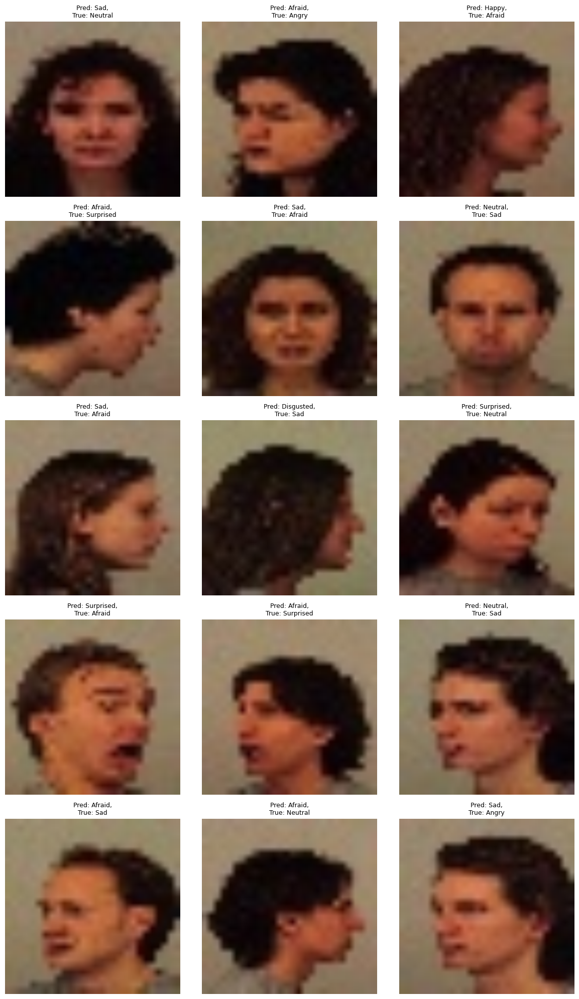




------------------------------------
 Accuracies  [0.7755102040816327, 0.753061224489796, 0.7693877551020409, 0.7775510204081634, 0.7673469387755103, 0.8, 0.7816326530612245, 0.7591836734693879]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.41it/s]


train Loss: 1.8392 Acc: 0.2444


100%|██████████| 16/16 [00:00<00:00, 18.17it/s]


val Loss: 1.6005 Acc: 0.3490

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.22it/s]


train Loss: 1.2160 Acc: 0.5456


100%|██████████| 16/16 [00:00<00:00, 16.60it/s]


val Loss: 1.0291 Acc: 0.6163

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.32it/s]


train Loss: 0.8671 Acc: 0.6762


100%|██████████| 16/16 [00:00<00:00, 18.41it/s]


val Loss: 0.9669 Acc: 0.6184

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.30it/s]


train Loss: 0.6337 Acc: 0.7662


100%|██████████| 16/16 [00:00<00:00, 16.65it/s]


val Loss: 0.8641 Acc: 0.6449

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.38it/s]


train Loss: 0.4739 Acc: 0.8304


100%|██████████| 16/16 [00:00<00:00, 17.16it/s]


val Loss: 1.0498 Acc: 0.6041

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.41it/s]


train Loss: 0.3124 Acc: 0.9043


100%|██████████| 16/16 [00:00<00:00, 18.38it/s]


val Loss: 0.6699 Acc: 0.7510

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.43it/s]


train Loss: 0.2517 Acc: 0.9229


100%|██████████| 16/16 [00:00<00:00, 17.54it/s]


val Loss: 0.6561 Acc: 0.7551

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.43it/s]


train Loss: 0.2208 Acc: 0.9354


100%|██████████| 16/16 [00:00<00:00, 17.77it/s]


val Loss: 0.6784 Acc: 0.7429

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.48it/s]


train Loss: 0.1857 Acc: 0.9492


100%|██████████| 16/16 [00:00<00:00, 17.83it/s]


val Loss: 0.6644 Acc: 0.7510

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.29it/s]


train Loss: 0.1751 Acc: 0.9533


100%|██████████| 16/16 [00:00<00:00, 17.46it/s]


val Loss: 0.6764 Acc: 0.7531

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.41it/s]


train Loss: 0.1684 Acc: 0.9571


100%|██████████| 16/16 [00:00<00:00, 18.48it/s]


val Loss: 0.6717 Acc: 0.7571

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.39it/s]


train Loss: 0.1491 Acc: 0.9680


100%|██████████| 16/16 [00:00<00:00, 17.44it/s]


val Loss: 0.6785 Acc: 0.7592

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.22it/s]


train Loss: 0.1410 Acc: 0.9717


100%|██████████| 16/16 [00:00<00:00, 17.81it/s]


val Loss: 0.6858 Acc: 0.7531

Epoch 13/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.51it/s]


train Loss: 0.1315 Acc: 0.9714


100%|██████████| 16/16 [00:00<00:00, 18.04it/s]


val Loss: 0.6801 Acc: 0.7510

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.47it/s]


train Loss: 0.1350 Acc: 0.9723


100%|██████████| 16/16 [00:00<00:00, 18.11it/s]


val Loss: 0.6784 Acc: 0.7531

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.44it/s]


train Loss: 0.1340 Acc: 0.9676


100%|██████████| 16/16 [00:00<00:00, 18.27it/s]


val Loss: 0.6961 Acc: 0.7571

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.30it/s]


train Loss: 0.1340 Acc: 0.9710


100%|██████████| 16/16 [00:00<00:00, 18.30it/s]


val Loss: 0.6801 Acc: 0.7531

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.20it/s]


train Loss: 0.1293 Acc: 0.9710


100%|██████████| 16/16 [00:00<00:00, 18.27it/s]


val Loss: 0.6825 Acc: 0.7551

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.16it/s]


train Loss: 0.1367 Acc: 0.9676


100%|██████████| 16/16 [00:00<00:00, 17.60it/s]


val Loss: 0.6812 Acc: 0.7571

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.39it/s]


train Loss: 0.1322 Acc: 0.9719


100%|██████████| 16/16 [00:00<00:00, 18.10it/s]


val Loss: 0.6769 Acc: 0.7531

Training complete in 4m 23s
Best val Acc: 0.759184
Showing misclassified examples for fold 8...


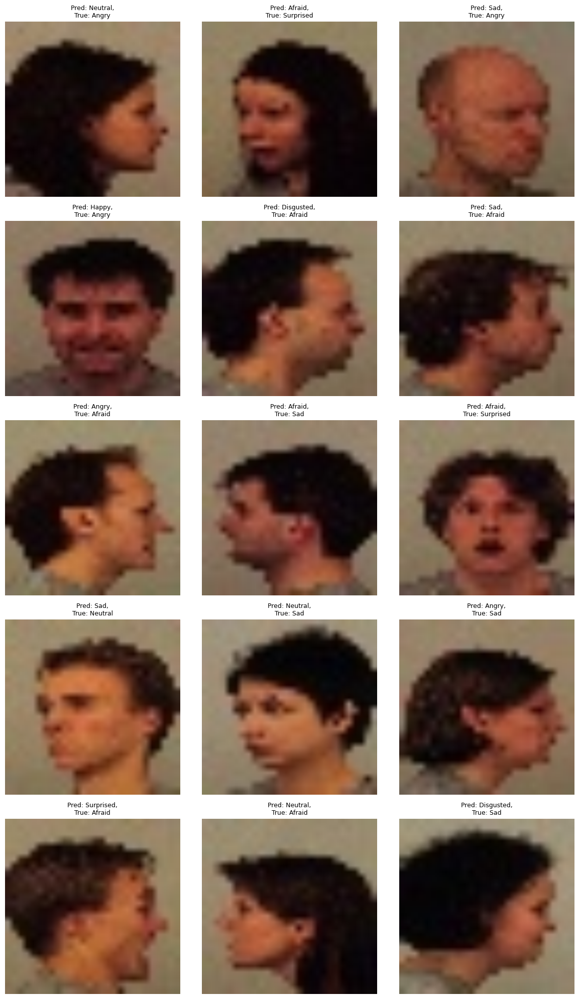




------------------------------------
 Accuracies  [0.7755102040816327, 0.753061224489796, 0.7693877551020409, 0.7775510204081634, 0.7673469387755103, 0.8, 0.7816326530612245, 0.7591836734693879, 0.7591836734693879]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.37it/s]


train Loss: 1.8252 Acc: 0.2540


100%|██████████| 16/16 [00:00<00:00, 17.57it/s]


val Loss: 1.5329 Acc: 0.4388

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.23it/s]


train Loss: 1.2207 Acc: 0.5340


100%|██████████| 16/16 [00:00<00:00, 18.09it/s]


val Loss: 1.0576 Acc: 0.5878

Epoch 2/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.53it/s]


train Loss: 0.8892 Acc: 0.6590


100%|██████████| 16/16 [00:00<00:00, 18.56it/s]


val Loss: 0.9692 Acc: 0.6204

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.16it/s]


train Loss: 0.6716 Acc: 0.7526


100%|██████████| 16/16 [00:00<00:00, 17.17it/s]


val Loss: 0.8993 Acc: 0.6510

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.32it/s]


train Loss: 0.5100 Acc: 0.8147


100%|██████████| 16/16 [00:00<00:00, 18.60it/s]


val Loss: 0.8891 Acc: 0.6857

Epoch 5/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.54it/s]


train Loss: 0.3259 Acc: 0.8946


100%|██████████| 16/16 [00:00<00:00, 16.72it/s]


val Loss: 0.6300 Acc: 0.7735

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.33it/s]


train Loss: 0.2641 Acc: 0.9229


100%|██████████| 16/16 [00:00<00:00, 18.57it/s]


val Loss: 0.6301 Acc: 0.7694

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.43it/s]


train Loss: 0.2250 Acc: 0.9376


100%|██████████| 16/16 [00:00<00:00, 18.64it/s]


val Loss: 0.6124 Acc: 0.7755

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.42it/s]


train Loss: 0.1959 Acc: 0.9506


100%|██████████| 16/16 [00:00<00:00, 18.60it/s]


val Loss: 0.6118 Acc: 0.7796

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.50it/s]


train Loss: 0.1889 Acc: 0.9508


100%|██████████| 16/16 [00:00<00:00, 18.45it/s]


val Loss: 0.6149 Acc: 0.7837

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.19it/s]


train Loss: 0.1693 Acc: 0.9571


100%|██████████| 16/16 [00:00<00:00, 18.51it/s]


val Loss: 0.6288 Acc: 0.7796

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.40it/s]


train Loss: 0.1473 Acc: 0.9662


100%|██████████| 16/16 [00:00<00:00, 17.97it/s]


val Loss: 0.6061 Acc: 0.7776

Epoch 12/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.57it/s]


train Loss: 0.1416 Acc: 0.9689


100%|██████████| 16/16 [00:00<00:00, 17.46it/s]


val Loss: 0.6145 Acc: 0.7816

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.48it/s]


train Loss: 0.1522 Acc: 0.9639


100%|██████████| 16/16 [00:00<00:00, 17.26it/s]


val Loss: 0.6098 Acc: 0.7714

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.37it/s]


train Loss: 0.1410 Acc: 0.9671


100%|██████████| 16/16 [00:00<00:00, 18.73it/s]


val Loss: 0.6145 Acc: 0.7837

Epoch 15/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.51it/s]


train Loss: 0.1471 Acc: 0.9615


100%|██████████| 16/16 [00:00<00:00, 18.75it/s]


val Loss: 0.6103 Acc: 0.7939

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.45it/s]


train Loss: 0.1324 Acc: 0.9698


100%|██████████| 16/16 [00:00<00:00, 18.43it/s]


val Loss: 0.6213 Acc: 0.7755

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.44it/s]


train Loss: 0.1319 Acc: 0.9737


100%|██████████| 16/16 [00:00<00:00, 18.06it/s]


val Loss: 0.6208 Acc: 0.7776

Epoch 18/19
----------


100%|██████████| 138/138 [00:11<00:00, 11.50it/s]


train Loss: 0.1353 Acc: 0.9701


100%|██████████| 16/16 [00:00<00:00, 16.54it/s]


val Loss: 0.6230 Acc: 0.7796

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.31it/s]


train Loss: 0.1382 Acc: 0.9687


100%|██████████| 16/16 [00:00<00:00, 17.14it/s]


val Loss: 0.6171 Acc: 0.7796

Training complete in 4m 23s
Best val Acc: 0.793878
Showing misclassified examples for fold 9...


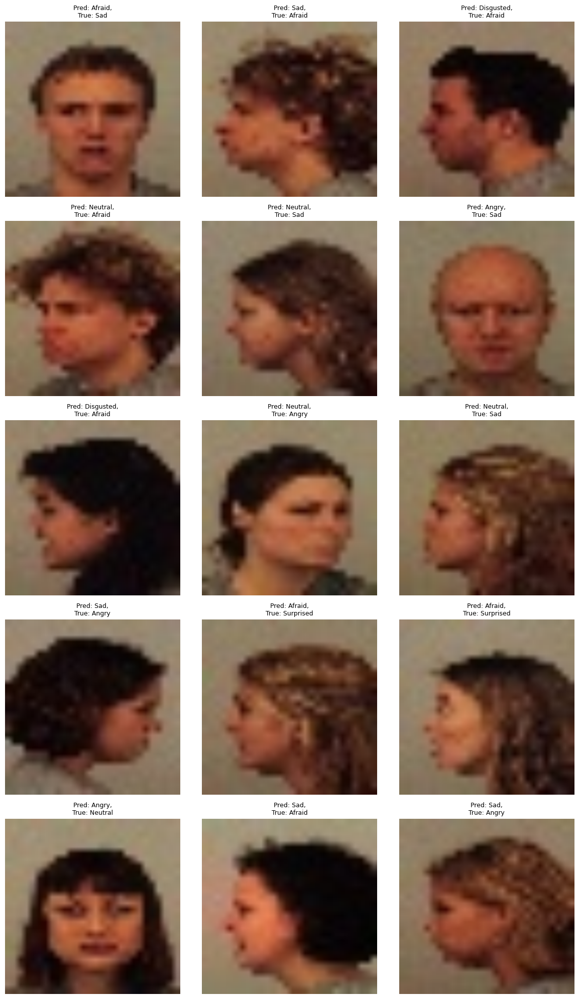




------------------------------------
 Accuracies  [0.7755102040816327, 0.753061224489796, 0.7693877551020409, 0.7775510204081634, 0.7673469387755103, 0.8, 0.7816326530612245, 0.7591836734693879, 0.7591836734693879, 0.7938775510204082]





In [54]:
accuracies = []
index = list(np.random.permutation(4900))

for i in range(10):
    idx = {
        'val': index[490 * i:490 * (i + 1)],
        'train': index[:i * 490] + index[((i + 1) * 490):]
    }

    dataloaders = {
        x: torch.utils.data.DataLoader(
            KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
            batch_size=32,
            shuffle=True
        )
        for x in ['train', 'val']
    }

    model_ft = models.resnet50(weights='IMAGENET1K_V1')
    num_ftrs = model_ft.fc.in_features
    model_ft.fc = nn.Linear(num_ftrs, class_names)
    model_ft = model_ft.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=6, gamma=0.1)

    logdir = f'./logs/resnet50_kfold_{i}'
    os.makedirs(logdir, exist_ok=True)  # Ensure logs dir exists
    writer = SummaryWriter(logdir)

    # 🛠️ ensure "saved" directory exists before saving the model
    os.makedirs('saved', exist_ok=True)

    model_ft, best_acc = train_model(
        model_ft,
        criterion,
        optimizer_ft,
        exp_lr_scheduler,
        dataloaders,
        writer,
        i,
        num_epochs=20
    )

    # Save model
    torch.save(model_ft.state_dict(), f'saved/model_fold_{i}.pt')

    print(f"Showing misclassified examples for fold {i}...")
    visualize_model_misclassified(
    model=model_ft,
    dataloader=dataloaders['val'],
    class_names={
        0: "Afraid", 1: "Angry", 2: "Disgusted",
        3: "Happy", 4: "Neutral", 5: "Sad", 6: "Surprised"
    },
    save_dir=f'misclassified/fold_{i}',
    num_images=15,

)

    accuracies.append(float(best_acc.cpu().numpy()))
    print("\n\n\n------------------------------------\n Accuracies ", accuracies)
    print("\n\n")



In [56]:
from google.colab import files

!zip -r resnet50_28x28_logs_and_saved_misclassified.zip logs saved misclassified
files.download('resnet50_28x28_logs_and_saved_misclassified.zip')

  adding: logs/ (stored 0%)
  adding: logs/resnet50_kfold_8/ (stored 0%)
  adding: logs/resnet50_kfold_8/events.out.tfevents.1744889921.180dcbd23e4b (deflated 62%)
  adding: logs/resnet50_kfold_2/ (stored 0%)
  adding: logs/resnet50_kfold_2/events.out.tfevents.1744886764.180dcbd23e4b (deflated 22%)
  adding: logs/resnet50_kfold_2/events.out.tfevents.1744886610.180dcbd23e4b (deflated 22%)
  adding: logs/resnet50_kfold_2/events.out.tfevents.1744888336.180dcbd23e4b (deflated 62%)
  adding: logs/resnet50_kfold_5/ (stored 0%)
  adding: logs/resnet50_kfold_5/events.out.tfevents.1744889126.180dcbd23e4b (deflated 62%)
  adding: logs/resnet50_kfold_4/ (stored 0%)
  adding: logs/resnet50_kfold_4/events.out.tfevents.1744888863.180dcbd23e4b (deflated 62%)
  adding: logs/resnet50_kfold_9/ (stored 0%)
  adding: logs/resnet50_kfold_9/events.out.tfevents.1744890187.180dcbd23e4b (deflated 62%)
  adding: logs/resnet50_kfold_6/ (stored 0%)
  adding: logs/resnet50_kfold_6/events.out.tfevents.1744889391.18

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>